# Example Application of Equity Methods to Semarang, Indonesia
Import libraries

In [1]:
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import hydromt
import folium
import contextily as cx
import seaborn as sns
import rioxarray as rio
from fiat_toolbox.well_being.methods import equity_weight
from fiat_toolbox.well_being import Household

# paths to folders
pdir = r'p:\11210264-001-just-equitable-paths\Case studies\FloodAdaptSemarang'
floodadaptdir = pdir + '/' + r'Database\Semarang_NEW\output\scenarios\2045_CMIP6_SSP2_4.5_Current_Demo1\Impacts'


## 1. Input Data
### 1.1 Damages Data
Read floodadapt data

In [2]:
# floodadapt data
# disaggregated data at the building level
dis_impacts = gpd.read_file(
    floodadaptdir + '/' + 'Impacts_building_footprints_2045_CMIP6_SSP2_4.5_Current_Demo1.gpkg',
    columns=['Max Potential Damage: Structure', 'Damage: Structure', 'geometry'])

# aggregated data at the village level
agg_impacts = gpd.read_file(floodadaptdir + '/' + 'Impacts_aggregated_2045_CMIP6_SSP2_4.5_Current_Demo1_DESA.gpkg')
print(len(agg_impacts))

currency = 'IDR'


# drop columns not needed
agg_impacts.drop(columns=['ResidentialMajorCount', 'ResidentialDestroyedCount', 'FloodedLowVulnerability',
                          'FloodedHighVulnerability', 'DisplacedLowVulnerability', 'DisplacedHighVulnerability'],
                          inplace=True)

# we will work on this crs and reproject the other files to this crs epsg=3857
crs_utm = agg_impacts.crs

# convert column names from Indonesian to English
language_dict = {
    'PROVNO': 'provinceNo',
    'KABKOTNO': 'regencyCityNo',
    'KECNO': 'KECNO', # not district number because same number corresponds to different ones
    'DESANO': 'villageNo',
    'PROVINSI': 'province',
    'KABKOT': 'regencyCity',  
    'KECAMATAN': 'district',
    'DESA': 'village',
    'IDDESA': 'villageID',
    'Luas_Desa': 'villageArea'  # which units?
}

'''
1st level: Provinces (Provinsi)
2nd level: Regencies (Kabupaten) and cities (Kota) (Kab/Kot)
3rd level: Districts (Kecamatan, Distrik, Kapanewon)
4th level: Villages (Desa) and Urban communities (Kelurahan)
'''

# map column names
agg_impacts.rename(columns=language_dict, inplace=True)
agg_impacts['villageID'] = agg_impacts['villageID'].astype('Int64')

village_boundaries = agg_impacts[['village', 'villageID', 'geometry']].copy()

agg_impacts.head(3)


236


,provinceNo,regencyCityNo,KECNO,villageNo,province,regencyCity,district,village,villageID,villageArea,TotalDamageEvent,geometry
0,33,21,10,1,JAWA TENGAH,DEMAK,MRANGGEN,BANYUMENENG,3321010001,3589696.88,0.000000e+00,"MULTIPOLYGON (((444991.747 9218738.926, 444899..."
1,33,21,10,2,JAWA TENGAH,DEMAK,MRANGGEN,SUMBEREJO,3321010002,963432.80,4.897375e+06,"MULTIPOLYGON (((445095.991 9214964.924, 445096..."
2,33,21,10,3,JAWA TENGAH,DEMAK,MRANGGEN,KEBONBATUR,3321010003,4270594.80,1.388191e+11,"MULTIPOLYGON (((446274.81 9220520.238, 446259...."


Merge the aggregated damages data with the disaggregated damages data as the assets and the asset damages is missing in the aggregated damages data. Only the total damages are available in the aggregated data.

In [3]:
impacts = gpd.sjoin(agg_impacts, dis_impacts, how='left', predicate='contains')

# drop unecessary column
impacts.drop(columns=['index_right'], inplace=True)

# drop duplicate rows based on the index of the left GeoDataFrame
impacts.drop_duplicates(subset=['villageID'], inplace=True)

# drop index_right not needed
impacts.drop(columns=['district'], inplace=True)

# export as json file
# impacts.to_file(floodadaptdir + '/' + 'Impacts_aggregated_AR.json')

In [4]:
agg_impacts = impacts

### 1.2 Socioeconomic Data
Read socioeconomic data
- 'Poverty Rate using National Poverty Line (NPL) -> \nFGT0 = Number of poor people / Total population',
- 'Standard Error of FGT0',
- 'Poverty Gap using National Poverty Line (NPL) -> \nFGT1 = (NPL - Per capita expenditure) / NPL*Total population',
- 'Standard Error of FGT1',
- 'Poverty Severity -> FGT2 = Square of FGT1',
- 'Standard Error of FGT2',
- 'Poverty Rate using International Poverty Line (US$3.1 PPP) -> \nFGT0 = Number of poor people / Total population',
- 'Standard Error of FGT0',
- 'Poverty Gap using International Poverty Line (US$3.1 PPP) -> \nFGT1 = (IPL - Per capita expenditure) / IPL*Total population',
- 'Standard Error of FGT1',
- 'Poverty Severity -> FGT2 = Square of FGT1',
- 'Standard Error of FGT2', 'Gini Index',
- 'Standard Error of Gini Index'

In [5]:
# socio economic data available at village (desa) level only
povmap = pd.read_excel(
    pdir + '/' + 'povmap_2015.xlsx',
    usecols=['des', 'nmdesa', 'p0_gkn', 'se_p0_gkn', 'p1_gkn', 'se_p1_gkn', 'p2_gkn', 'se_p2_gkn', 'p0_intl',
             'se_p0_intl', 'p1_intl', 'se_p1_intl', 'p2_intl', 'se_p2_intl', 'gini', 'se_gini'])

povlegend = pd.read_excel(pdir + '/' + 'variable_2015.xlsx')
# only keep legend for poverty variables
povlegend = povlegend.loc[31:,:]

# keep poverty indices only for the village (desa) that are present in the floodadapt data
villages_impacts = list(np.unique(agg_impacts.villageID))  
villages_pov = list(np.unique(povmap.des)) 

villages_ids = list(set(villages_impacts) & set(villages_pov)) 

# filter povmap
povmap = povmap[povmap['des'].isin(villages_ids)]  


Plot poverty data

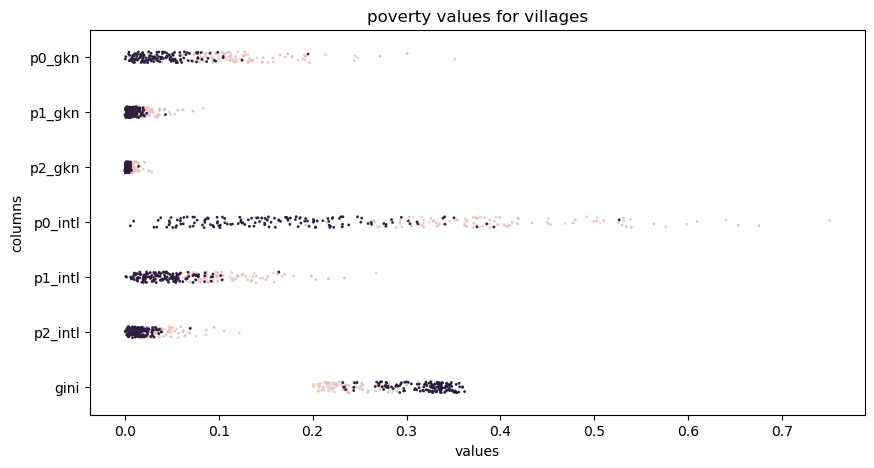

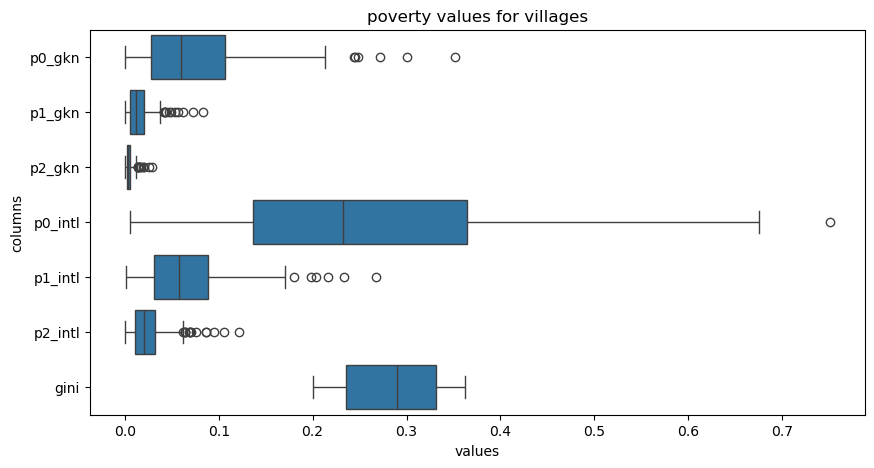

In [6]:
# explore poverty data
povvars = ['p0_gkn', 'p1_gkn', 'p2_gkn', 'p0_intl', 'p1_intl', 'p2_intl', 'gini']

df_melt = povmap.melt(id_vars='des', value_vars=povvars, var_name='columns', value_name='values')

fig, ax = plt.subplots(figsize=(10, 5))
ax.set_title('poverty values for villages')
sns.stripplot(data=df_melt, ax=ax, x='values', y='columns', hue='des', jitter=True, size=2)
plt.legend([],[], frameon=False)

fig, ax = plt.subplots(figsize=(10, 5))
ax.set_title('poverty values for villages')
sns.boxplot(data=df_melt, ax=ax, x='values', y='columns')
plt.legend([],[], frameon=False)

Merge socioeconomic data with damages data at the village level

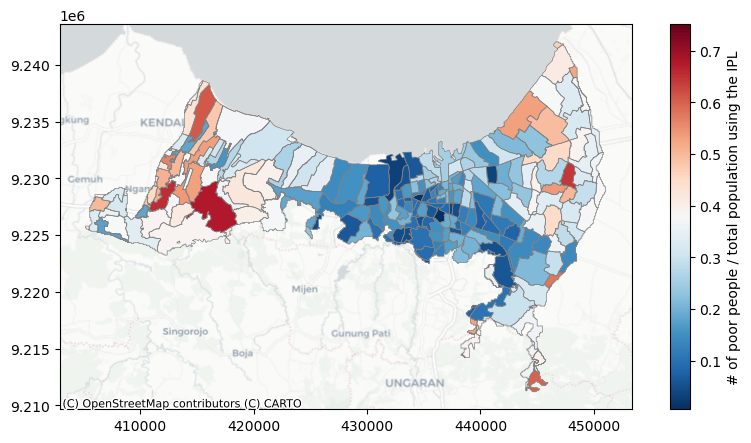

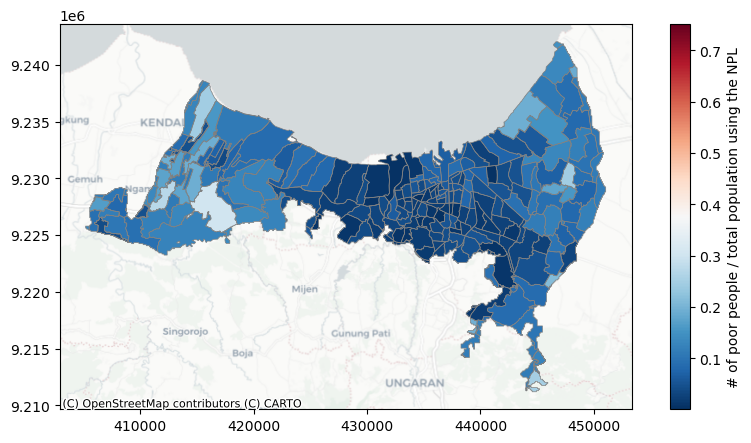

In [7]:
# add poverty variables to impacts dataframe
int_pov_var = 'p0_intl'
nat_pov_var = 'p0_gkn'

agg_impacts = pd.merge(
    agg_impacts,
    povmap[['nmdesa', int_pov_var, nat_pov_var]],
    left_on='village',
    right_on='nmdesa')

# remove nmdesa as it is the same as village
agg_impacts.drop(columns='nmdesa', inplace=True)

# use same cmax value
vmax = max(agg_impacts[int_pov_var].max(), agg_impacts[nat_pov_var].max())

# plot poverty variables on map
cmap = 'RdBu_r'
fig, ax = plt.subplots(figsize=(10, 5))
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
agg_impacts.plot(
    ax=ax,
    column=int_pov_var,
    cmap=cmap,
    vmax=vmax,
    legend=True,
    legend_kwds={"label": f"# of poor people / total population using the IPL"}
    )
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)

fig, ax = plt.subplots(figsize=(10, 5))
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
agg_impacts.plot(
    ax=ax,
    column=nat_pov_var,
    cmap=cmap,
    vmax=vmax,
    legend=True,
    legend_kwds={"label": f"# of poor people / total population using the NPL"}
    )
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)

Read administrative area. This is not really necessary, I can clip the population data directly to the extent of the damages data.

In [8]:
# administrative units
admin = gpd.read_file(pdir + '/' + 'administrative' + '/idn_adm_bps_20200401_shp/idn_admbnda_adm2_bps_20200401.shp')
print(admin.crs)

# reproject crs
admin = admin.to_crs(crs_utm)

adm2_names = list(np.unique(agg_impacts['regencyCity']))
# make first letter uppercase and rest lowercase just as in pop and admin dataframes
adm2_names = [value.title() for value in adm2_names]

# filter adm
admin = admin[admin['ADM2_EN'].isin(adm2_names)]

# # get bounding box of admin areas considered
# minx, miny, maxx, maxy = admin.total_bounds

EPSG:4326


### 1.3 Population Data
Read population data. We can get global gridded population at 100m resolution from World Pop Hub: https://hub.worldpop.org/geodata/summary?id=49915
although the population data for Indonesia is available for 2020 whereas the poverty data is from 2015

In [9]:
pop = xr.open_dataarray(pdir + '/' + 'population' + '/idn_ppp_2020_UNadj_constrained.tif')
print(pop.raster.crs)  # EPSG:4326

# clip pop to bounding box of floodadapt results
pop = pop.raster.clip_geom(admin.to_crs('EPSG:4326'))

# reproject crs
pop = pop.raster.reproject(dst_crs=crs_utm)

# save reprojected world pop for admin2 levels considered
# pop.rio.to_raster(pdir + '/' + 'population' + '/idn_ppp_2020_UNadj_constrained_DKS.tif')

GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]


Combine population data with damages data.

TotalDamageEvent
NaN             5
4.897375e+06    2
3.464069e+10    2
0.000000e+00    2
Name: count, dtype: int64

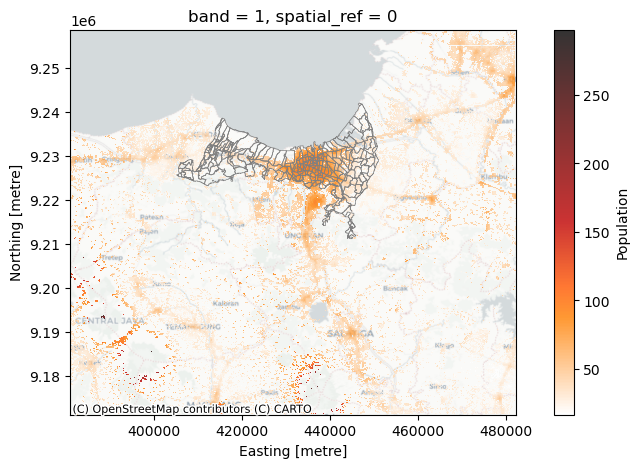

In [10]:
damages = 'TotalDamageEvent'

cmap = 'gist_heat_r'
fig, ax = plt.subplots(figsize=(10, 5))
ax.set_title('Population raster and villages boundaries overlayed')
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
pop.plot(ax=ax, alpha=0.8, cmap=cmap, cbar_kwargs={'label': 'Population'})
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)

popsum = pop.raster.zonal_stats(agg_impacts, stats='sum', all_touched=False)
popvillage = popsum['band_data_sum'].to_numpy()
agg_impacts['Population'] = popvillage
# gives 9 villages with 0 population because the size is very small

popsum = pop.raster.zonal_stats(agg_impacts, stats='sum', all_touched=True)
popvillage = popsum['band_data_sum'].to_numpy()
agg_impacts['PopulationTouched'] = popvillage
# gives 7 villages with 0 population


agg_impacts[agg_impacts['Population'] == 0][damages].value_counts(dropna=False)


Plot population data

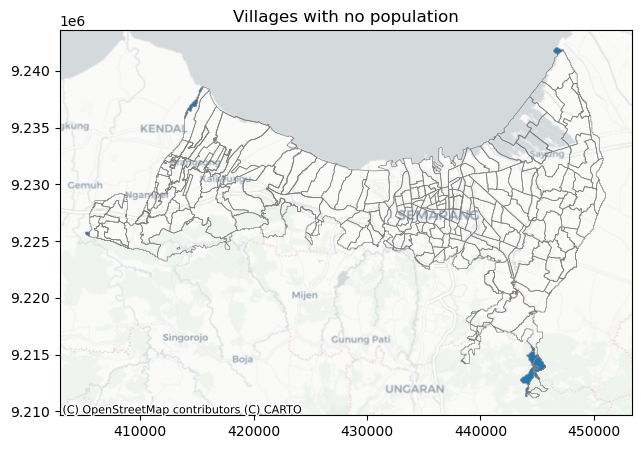

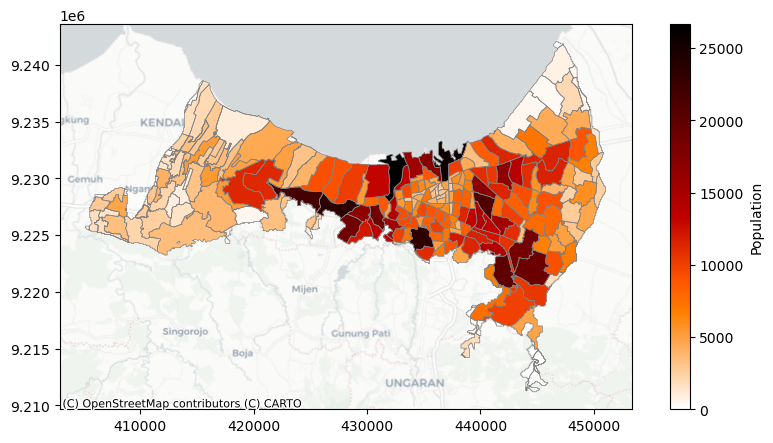

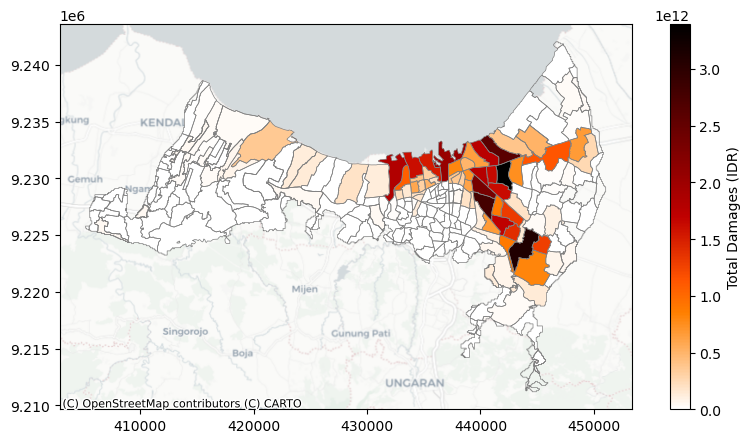

In [11]:
# visualize villages with population = 0 on a map
fig, ax = plt.subplots(figsize=(10, 5))
ax.set_title('Villages with no population')
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
agg_impacts[agg_impacts['Population'] == 0].plot(ax=ax)
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)

# visualize the population per village on a map
fig, ax = plt.subplots(figsize=(10, 5))
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
agg_impacts.plot(ax=ax, column='Population', cmap=cmap, legend=True, legend_kwds={"label": "Population"})
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)

# visualize the damages per village on a map
fig, ax = plt.subplots(figsize=(10, 5))
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
agg_impacts.plot(ax=ax, column=damages, cmap=cmap, legend=True, legend_kwds={"label": f"Total Damages ({currency})"})
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)

## 2. Compute Equity Weighted Damages
Instead of income we will use a poverty variable. We need to convert the 'negative' poverty variable into a 'positive' variable. Then, we can compute the weighted average, the equity weights and lastly, the equity weighted damages. Note: we are using the total damages.

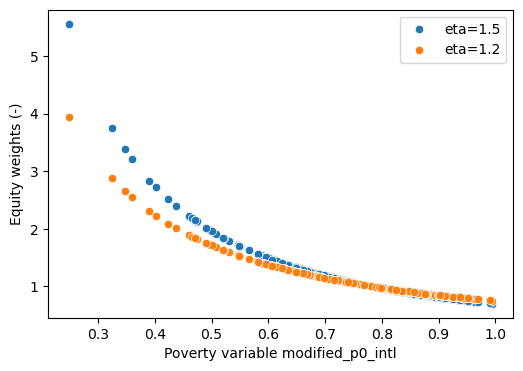

In [12]:
# instead of number of poor people/tot pop, we convert to number of non-poor people/tot pop
pov_var_mod = f'modified_{int_pov_var}'
agg_impacts[pov_var_mod] = 1 - agg_impacts[int_pov_var]

# compute the weighted average
avg_pov = np.average(agg_impacts[pov_var_mod], weights=agg_impacts['Population'])

# use equity weights function from fiat_toolbox
# compute equity weights for eta=1.5 and eta=1.2
agg_impacts['EW_15'] = agg_impacts.apply(lambda row: equity_weight(row[pov_var_mod], avg_pov, 1.5), axis=1)
agg_impacts['EW_12'] = agg_impacts.apply(lambda row: equity_weight(row[pov_var_mod], avg_pov, 1.2), axis=1)

# verify that the EW make sense for two different values of eta
fig, ax = plt.subplots(figsize=(6, 4))
sns.scatterplot(ax=ax, data=agg_impacts, x=pov_var_mod, y='EW_15', label='eta=1.5')
sns.scatterplot(ax=ax, data=agg_impacts, x=pov_var_mod, y='EW_12', label='eta=1.2')
ax.set_ylabel('Equity weights (-)')
ax.set_xlabel(f'Poverty variable {pov_var_mod}')
plt.legend()

# compute equity weighted damages
agg_impacts['EW_15_damages'] = agg_impacts[damages] * agg_impacts['EW_15']
agg_impacts['EW_12_damages'] = agg_impacts[damages] * agg_impacts['EW_12']


Plot equity weighted total damages

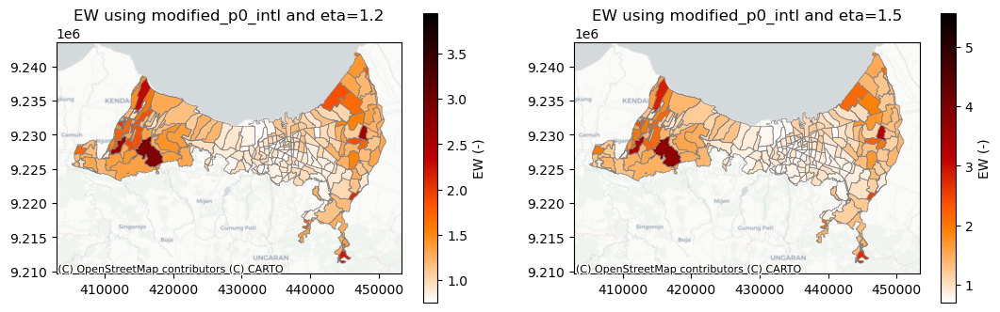

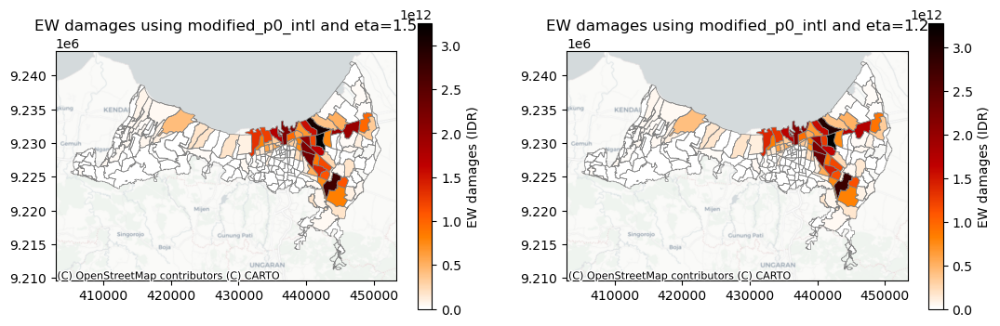

In [13]:
# visualize equity weights
fig, ax = plt.subplots(1, 2, figsize=(13, 4))
ax[0].set_title(f'EW using {pov_var_mod} and eta=1.2')
agg_impacts.boundary.plot(ax=ax[0], color='grey', lw=0.5)
agg_impacts.plot(ax=ax[0], column='EW_12', cmap=cmap, legend=True, legend_kwds={"label": "EW (-)"})
cx.add_basemap(ax[0], crs=crs_utm, source=cx.providers.CartoDB.Positron)

ax[1].set_title(f'EW using {pov_var_mod} and eta=1.5')
agg_impacts.boundary.plot(ax=ax[1], color='grey', lw=0.5)
agg_impacts.plot(ax=ax[1], column='EW_15', cmap=cmap, legend=True, legend_kwds={"label": "EW (-)"})
cx.add_basemap(ax[1], crs=crs_utm, source=cx.providers.CartoDB.Positron)

# visualize equity weighted damages
fig, ax = plt.subplots(1, 2, figsize=(13, 4))
ax[0].set_title(f'EW damages using {pov_var_mod} and eta=1.5')
agg_impacts.boundary.plot(ax=ax[0], color='grey', lw=0.5)
agg_impacts.plot(ax=ax[0], column='EW_15_damages', cmap=cmap, legend=True, legend_kwds={"label": f"EW damages ({currency})"})
cx.add_basemap(ax[0], crs=crs_utm, source=cx.providers.CartoDB.Positron)

ax[1].set_title(f'EW damages using {pov_var_mod} and eta=1.2')
agg_impacts.boundary.plot(ax=ax[1], color='grey', lw=0.5)
agg_impacts.plot(ax=ax[1], column='EW_12_damages', cmap=cmap, legend=True, legend_kwds={"label": f"EW damages ({currency})"})
cx.add_basemap(ax[1], crs=crs_utm, source=cx.providers.CartoDB.Positron)


Compare total damages with equity weighted damages

3394198905368.649


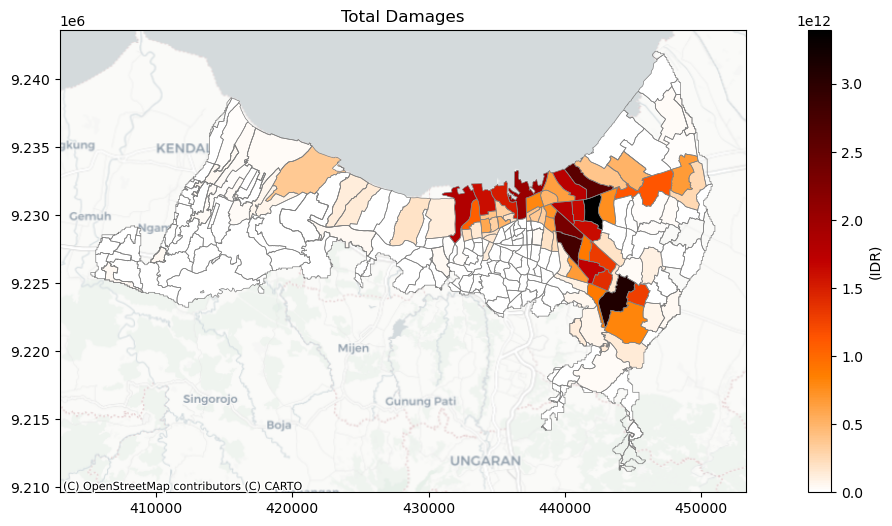

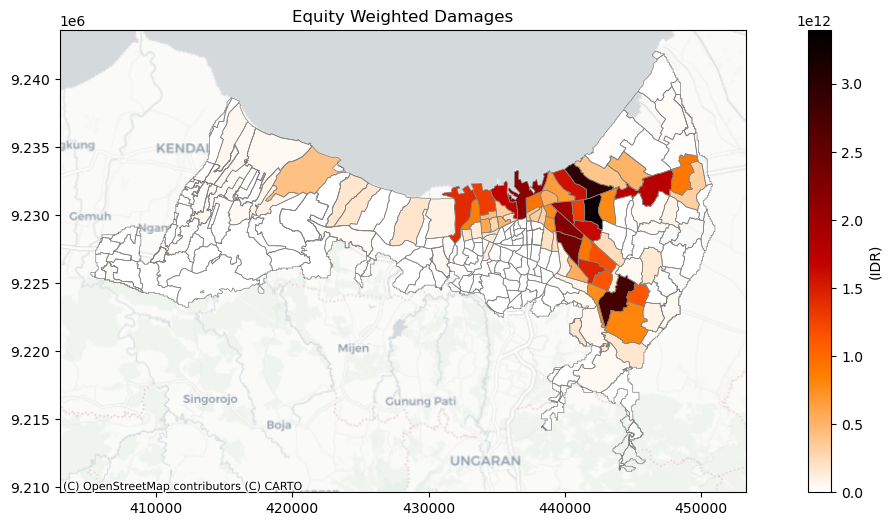

In [14]:
agg_impacts.columns

cbarmax = max(agg_impacts['TotalDamageEvent'].max(), agg_impacts['EW_12_damages'].max())
print(cbarmax)

figsize = (16, 6)
fig, ax = plt.subplots(figsize=figsize)
ax.set_title(f'Total Damages')
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
agg_impacts.plot(ax=ax, column='TotalDamageEvent', cmap=cmap, vmax=cbarmax, legend=True, legend_kwds={"label": f"({currency})"})
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)

fig, ax = plt.subplots(figsize=figsize)
ax.set_title(f'Equity Weighted Damages')
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
agg_impacts.plot(ax=ax, column='EW_12_damages', cmap=cmap, vmax=cbarmax, legend=True, legend_kwds={"label": f"({currency})"})
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)

## 3. Wellbeing Method

Structural/asset damages and ratio of structural damages to total structural values


Configurations

Population is from 2020, poverty variables => income is from 2015, what about data used for structure? which year is it from?

In [15]:
pi = 2654915 / 14083079 # year 2015 
eta = 1.5
rho = 0.06 # discount rate where to get this from?
t_max = 10
dt = 1 / 52


Income data

Based on the poverty variables, we can create 3 income brackets: from 0 to $2.15, from $2.15 to $3.1 and from $3.1 to upper boundary
based on p0_gkn and p0_intl and using average income population (at a more aggregated level). The obtained income will be used as the predisaster consumption.

In [16]:
conv_factor = 16536.14  # IDR/$
npl = 2.15 * 365 * conv_factor # $/year
ipl = 3.1 * 365 * conv_factor # $/year
x = 400 * 12 * conv_factor # value we assume for the pop in the 3rd bracket
# assume an income per capita  $
avg_inc = 350 * 12  * conv_factor # $/year

# convert to per capita income
agg_impacts['yearly_income'] = (
    (0 + npl) / 2) * agg_impacts[nat_pov_var] + (
        (npl + ipl) / 2) * agg_impacts[int_pov_var] + x * (
            1-agg_impacts[int_pov_var])

agg_impacts['total_income'] = agg_impacts['yearly_income'] * agg_impacts['Population']

# we compute the average income for the whole area and expect to get back the avg_inc
avg_inc_calc = agg_impacts['total_income'].sum() / agg_impacts['Population'].sum()

print(f'''The yearly income average is {currency} {avg_inc}, using {currency} {x} as the value for the third bracket gives an estimated
yearly income for Semarang of ${avg_inc_calc:.2f}''')

The yearly income average is IDR 69451788.0, using IDR 79373472.0 as the value for the third bracket gives an estimated
yearly income for Semarang of $65916989.00


Instead of the total damages, we use the damages to the structure, the maximum value of the structure and the ratio of the latter two as the 'vulnerability'.

We can also test the difference by including and excluding the threshold on post disaster consumption.

In [17]:
asset_damages = 'Damage: Structure'
asset_value = 'Max Potential Damage: Structure'
agg_impacts['relative_damages'] = agg_impacts[asset_damages] / agg_impacts[asset_value]

# drop rows from agg_impacts where asset_damages = 0 or np.nan
filtered_impacts = agg_impacts[agg_impacts[asset_damages] > 0 ]

# now we can move on to the wellbeing method
losses = {}
objects = {}

thresh_impacts = filtered_impacts.copy()
thresh_losses = {}
thresh_objects = {}

for i, household in filtered_impacts.iterrows():
    id = household['villageID']
    # perhaps add village name (which can be repeated) as well?
    var = Household(v=household['relative_damages'],
                    k_str=household[asset_value],
                    c0=household['yearly_income'],
                    c_avg=avg_inc_calc,
                    pi=pi,
                    t_max=t_max, 
                    currency=currency,
                    )
    var.opt_lambda()
    losses[id] = var.get_losses()
    objects[id] = var

for i, household in thresh_impacts.iterrows():
    id = household['villageID']
    # perhaps add village name (which can be repeated) as well?
    var = Household(v=household['relative_damages'],
                    k_str=household[asset_value],
                    c0=household['yearly_income'],
                    c_avg=avg_inc_calc,
                    pi=pi,
                    t_max=t_max, 
                    currency=currency,
                    cmin=npl
                    )
    var.opt_lambda()
    thresh_losses[id] = var.get_losses()
    thresh_objects[id] = var


losses = pd.DataFrame(losses)
print(losses[losses.index == 'Wellbeing Loss'].notna().sum(axis=1))
display(losses)

thresh_losses = pd.DataFrame(thresh_losses)
print(thresh_losses[thresh_losses.index == 'Wellbeing Loss'].notna().sum(axis=1))
display(thresh_losses)

Wellbeing Loss    24
dtype: int64


,3321010007,3321010009,3321010011,3321010016,3321040001,3321040005,3321040010,3321040011,3321040012,3321040013,...,3374100007,3374110007,3374110010,3374120001,3374120002,3374120003,3374120004,3374130014,3374130015,3374140016
Reconstruction Costs,2.796200e+05,1.760777e+07,2.119829e+05,1.694808e+08,2.604837e+08,6.070805e+07,1.924459e+08,5.096958e+04,1.022134e+08,663572.719856,...,3.419803e+08,1.283223e+08,1.030501e+06,7.582432e+07,3.316054e+07,1.104200e+07,3.164853e+08,1.479676e+07,1.670890e+08,1.220233e+08
Income Loss,5.940106e+03,2.917988e+06,4.001953e+03,1.066524e+08,1.639195e+08,3.820290e+07,1.211041e+08,9.622376e+02,6.432176e+07,19501.285135,...,2.152044e+08,8.075182e+07,3.874884e+04,4.771540e+07,8.458705e+06,1.486893e+06,1.991607e+08,2.061870e+06,1.051472e+08,7.678788e+07
Consumption Loss,2.855601e+05,2.052576e+07,2.159848e+05,2.761332e+08,4.244032e+08,9.891094e+07,3.135500e+08,5.193182e+04,1.665352e+08,683074.004991,...,5.571847e+08,2.090742e+08,1.069250e+06,1.235397e+08,4.161925e+07,1.252890e+07,5.156460e+08,1.685863e+07,2.722362e+08,1.988112e+08
Utility Loss,6.050737e-07,3.976925e-05,5.920786e-07,NaN,NaN,6.204124e-04,NaN,1.129552e-07,NaN,0.000001,...,NaN,7.049025e-04,2.370072e-06,3.168494e-04,8.691828e-05,2.873638e-05,NaN,2.724336e-05,NaN,5.121311e-04
Wellbeing Loss,3.216736e+05,2.029142e+07,3.150002e+05,NaN,NaN,2.928721e+08,NaN,6.009260e+04,NaN,705456.668651,...,NaN,3.386874e+08,1.253686e+06,1.478066e+08,4.337221e+07,1.478385e+07,NaN,1.399802e+07,NaN,2.428703e+08
Asset Loss,2.789459e+05,1.760727e+07,2.113363e+05,1.784004e+08,2.741926e+08,6.390303e+07,2.025741e+08,5.081412e+04,1.075928e+08,662735.710000,...,3.599783e+08,1.350758e+08,1.029707e+06,7.981486e+07,3.318046e+07,1.104135e+07,3.331415e+08,1.479595e+07,1.758827e+08,1.284452e+08
Equity Weighted Loss,3.113514e+05,1.583511e+07,3.051186e+05,2.070473e+08,4.658326e+08,1.338495e+08,2.624346e+08,5.895564e+04,1.673156e+08,673091.285983,...,3.840082e+08,1.208691e+08,1.179948e+06,8.026517e+07,3.033257e+07,1.203527e+07,2.717495e+08,1.132164e+07,1.565944e+08,1.039795e+08


Wellbeing Loss    20
dtype: int64


,3321010007,3321010009,3321010011,3321010016,3321040001,3321040005,3321040010,3321040011,3321040012,3321040013,...,3374100007,3374110007,3374110010,3374120001,3374120002,3374120003,3374120004,3374130014,3374130015,3374140016
Reconstruction Costs,2.795118e+05,1.760701e+07,2.117832e+05,1.694808e+08,2.604837e+08,6.070805e+07,1.924459e+08,5.096958e+04,1.022134e+08,663417.909448,...,3.419803e+08,1.283223e+08,1.030330e+06,7.582432e+07,3.312155e+07,1.104179e+07,3.164853e+08,1.479653e+07,1.670890e+08,1.220233e+08
Income Loss,6.480732e+03,3.320402e+06,4.809698e+03,1.066524e+08,1.639195e+08,3.820290e+07,1.211041e+08,9.622376e+02,6.432176e+07,21596.414264,...,2.152044e+08,8.075182e+07,4.373181e+04,4.771540e+07,9.869256e+06,1.714515e+06,1.991607e+08,2.301638e+06,1.051472e+08,7.678788e+07
Consumption Loss,2.859925e+05,2.092741e+07,2.165929e+05,2.761332e+08,4.244032e+08,9.891094e+07,3.135500e+08,5.193182e+04,1.665352e+08,685014.323712,...,5.571847e+08,2.090742e+08,1.074062e+06,1.235397e+08,4.299080e+07,1.275631e+07,5.156460e+08,1.709817e+07,2.722362e+08,1.988112e+08
Utility Loss,8.683204e-07,5.585718e-05,9.185073e-07,NaN,NaN,NaN,NaN,1.632932e-07,NaN,0.000002,...,NaN,NaN,3.443353e-06,4.990095e-04,1.249047e-04,4.221173e-05,NaN,3.664259e-05,NaN,1.054018e-03
Wellbeing Loss,4.613449e+05,2.833205e+07,4.880814e+05,NaN,NaN,NaN,NaN,8.687283e+04,NaN,989146.940853,...,NaN,NaN,1.818747e+06,2.349173e+08,6.171632e+07,2.159693e+07,NaN,1.874620e+07,NaN,5.176046e+08
Asset Loss,2.789459e+05,1.760727e+07,2.113363e+05,1.784004e+08,2.741926e+08,6.390303e+07,2.025741e+08,5.081412e+04,1.075928e+08,662735.710000,...,3.599783e+08,1.350758e+08,1.029707e+06,7.981486e+07,3.318046e+07,1.104135e+07,3.331415e+08,1.479595e+07,1.758827e+08,1.284452e+08
Equity Weighted Loss,3.113514e+05,1.583511e+07,3.051186e+05,2.070473e+08,4.658326e+08,1.338495e+08,2.624346e+08,5.895564e+04,1.673156e+08,673091.285983,...,3.840082e+08,1.208691e+08,1.179948e+06,8.026517e+07,3.033257e+07,1.203527e+07,2.717495e+08,1.132164e+07,1.565944e+08,1.039795e+08


Merge losses computed with geodataframe

In [18]:
from enum import Enum

losses = losses.T
loss_list = list(losses.columns)
cols_to_add = [item.value if isinstance(item, Enum) else item for item in loss_list]

filtered_impacts = pd.merge(left=filtered_impacts, right=losses, left_on='villageID', right_index=True)
filtered_impacts.head(3)

thresh_losses = thresh_losses.T
loss_list = list(thresh_losses.columns)
cols_to_add = [item.value if isinstance(item, Enum) else item for item in loss_list]

thresh_impacts = pd.merge(left=thresh_impacts, right=thresh_losses, left_on='villageID', right_index=True)
thresh_impacts.head(3)

,provinceNo,regencyCityNo,KECNO,villageNo,province,regencyCity,village,villageID,villageArea,TotalDamageEvent,...,yearly_income,total_income,relative_damages,Reconstruction Costs,Income Loss,Consumption Loss,Utility Loss,Wellbeing Loss,Asset Loss,Equity Weighted Loss
7,33,21,10,7,JAWA TENGAH,DEMAK,MRANGGEN,3321010007,2586323.03,7.666833e+10,...,6.125997e+07,5.617678e+11,0.447000,2.795118e+05,6.480732e+03,2.859925e+05,8.683204e-07,4.613449e+05,278945.88,3.113514e+05
9,33,21,10,9,JAWA TENGAH,DEMAK,BANDUNGREJO,3321010009,1842551.22,1.276341e+12,...,7.074756e+07,4.661294e+11,0.760892,1.760701e+07,3.320402e+06,2.092741e+07,5.585718e-05,2.833205e+07,17607274.51,1.583511e+07
11,33,21,10,11,JAWA TENGAH,DEMAK,NGEMPLAK,3321010011,3262557.64,9.854817e+10,...,5.160213e+07,4.121833e+11,0.715680,2.117832e+05,4.809698e+03,2.165929e+05,9.185073e-07,4.880814e+05,211336.30,3.051186e+05


Merge lambda with geodataframe and add recovery time

In [19]:
from fiat_toolbox.well_being.methods import recovery_time
filtered_impacts['lambda'] = filtered_impacts['villageID'].apply(lambda x: objects[x].l)
filtered_impacts['recovery_time'] = filtered_impacts['lambda'].apply(recovery_time)
# update recovery time to be np.nan when utility loss is np.nan
filtered_impacts.loc[np.isnan(filtered_impacts['Utility Loss']), 'recovery_time'] = np.nan
print(filtered_impacts.head(3))

thresh_impacts['lambda'] = thresh_impacts['villageID'].apply(lambda x: objects[x].l)
thresh_impacts['recovery_time'] = thresh_impacts['lambda'].apply(recovery_time)
# update recovery time to be np.nan when utility loss is np.nan
thresh_impacts.loc[np.isnan(thresh_impacts['Utility Loss']), 'recovery_time'] = np.nan
print(thresh_impacts.head(3))

   provinceNo regencyCityNo KECNO villageNo     province regencyCity  \
7          33            21    10         7  JAWA TENGAH       DEMAK   
9          33            21    10         9  JAWA TENGAH       DEMAK   
11         33            21    10        11  JAWA TENGAH       DEMAK   

        village   villageID  villageArea  TotalDamageEvent  ...  \
7      MRANGGEN  3321010007   2586323.03      7.666833e+10  ...   
9   BANDUNGREJO  3321010009   1842551.22      1.276341e+12  ...   
11     NGEMPLAK  3321010011   3262557.64      9.854817e+10  ...   

   relative_damages  Reconstruction Costs   Income Loss  Consumption Loss  \
7          0.447000          2.796200e+05  5.940106e+03      2.855601e+05   
9          0.760892          1.760777e+07  2.917988e+06      2.052576e+07   
11         0.715680          2.119829e+05  4.001953e+03      2.159848e+05   

    Utility Loss  Wellbeing Loss   Asset Loss  Equity Weighted Loss    lambda  \
7   6.050737e-07    3.216736e+05    278945.88       

Plot the results

Text(0.5, 1.0, 'Recovery Time with Consumption Threshold')

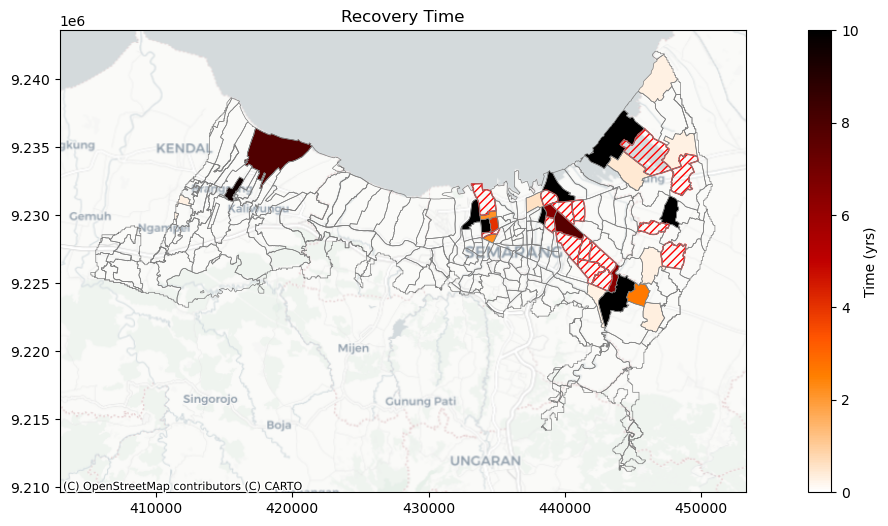

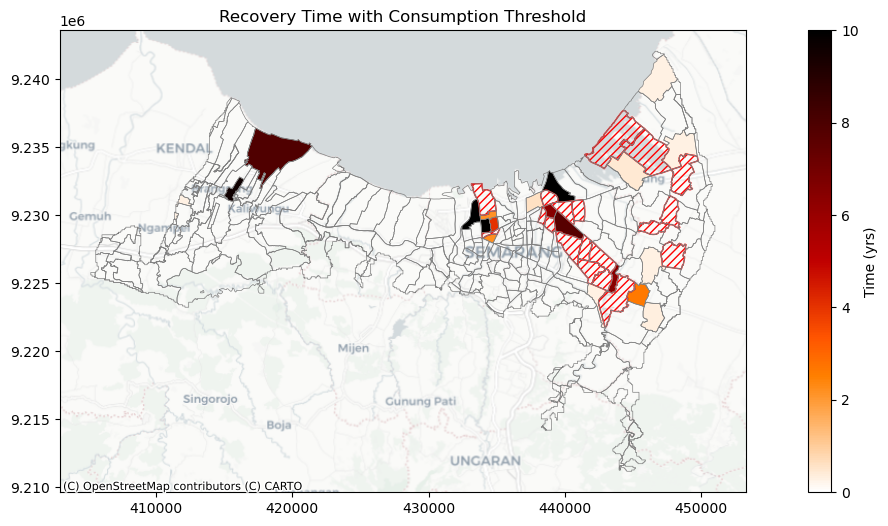

In [20]:
fig, ax = plt.subplots(figsize=(16, 6))
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
filtered_impacts.plot(
    ax=ax,
    column='recovery_time',
    cmap=cmap,
    vmin=0,
    legend=True,
    legend_kwds={"label": "Time (yrs)"},
    missing_kwds={"color": (0,0,0,0), "edgecolor": "red", "hatch": "////", "label": "Missing values"})
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)
ax.set_title('Recovery Time')

fig, ax = plt.subplots(figsize=(16, 6))
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
thresh_impacts.plot(
    ax=ax,
    column='recovery_time',
    cmap=cmap,
    vmin=0,
    legend=True,
    legend_kwds={"label": "Time (yrs)"},
    missing_kwds={"color": (0,0,0,0), "edgecolor": "red", "hatch": "////", "label": "Missing values"})
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)
ax.set_title('Recovery Time with Consumption Threshold')

Compare damages to structure, EW damages to structure and wellbeing losses

In [21]:
filtered_impacts.columns

Index(['provinceNo', 'regencyCityNo', 'KECNO', 'villageNo', 'province',
       'regencyCity', 'village', 'villageID', 'villageArea',
       'TotalDamageEvent', 'geometry', 'Damage: Structure',
       'Max Potential Damage: Structure', 'p0_intl', 'p0_gkn', 'Population',
       'PopulationTouched', 'modified_p0_intl', 'EW_15', 'EW_12',
       'EW_15_damages', 'EW_12_damages', 'yearly_income', 'total_income',
       'relative_damages', 'Reconstruction Costs', 'Income Loss',
       'Consumption Loss', 'Utility Loss', 'Wellbeing Loss', 'Asset Loss',
       'Equity Weighted Loss', 'lambda', 'recovery_time'],
      dtype='object')

Text(0.5, 1.0, 'Wellbeing Losses with Consumption Threshold')

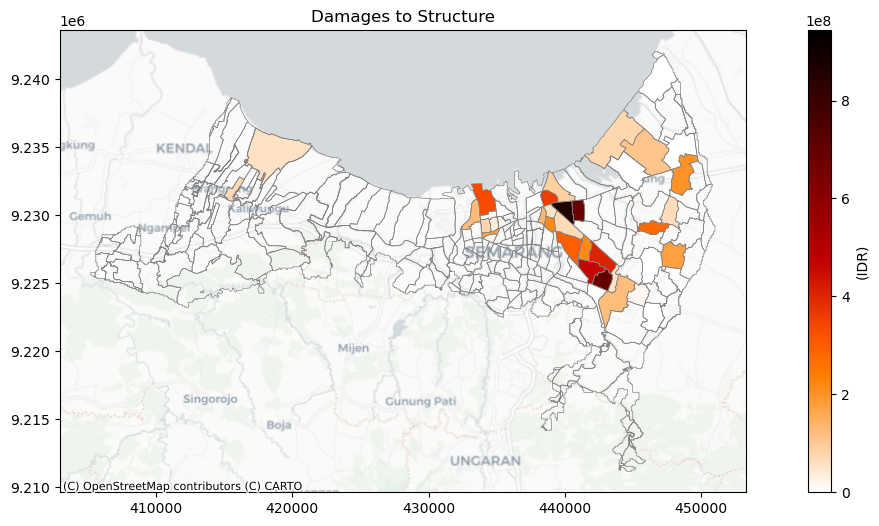

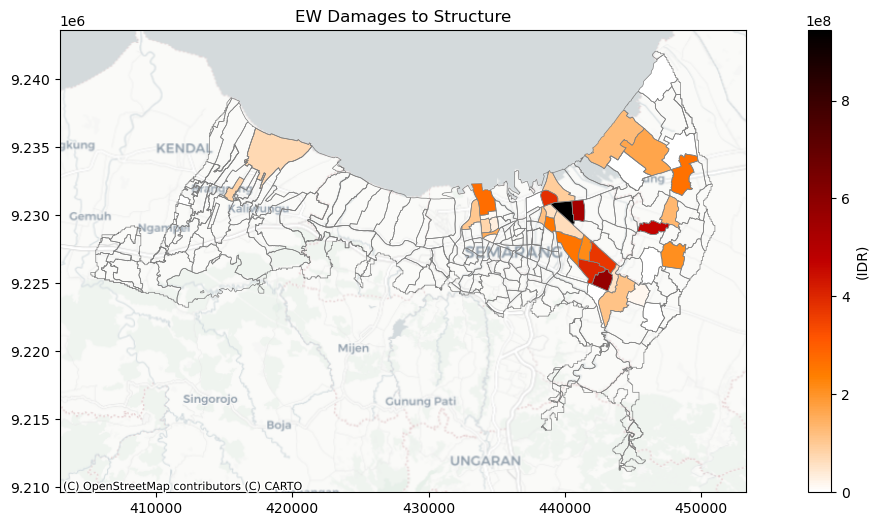

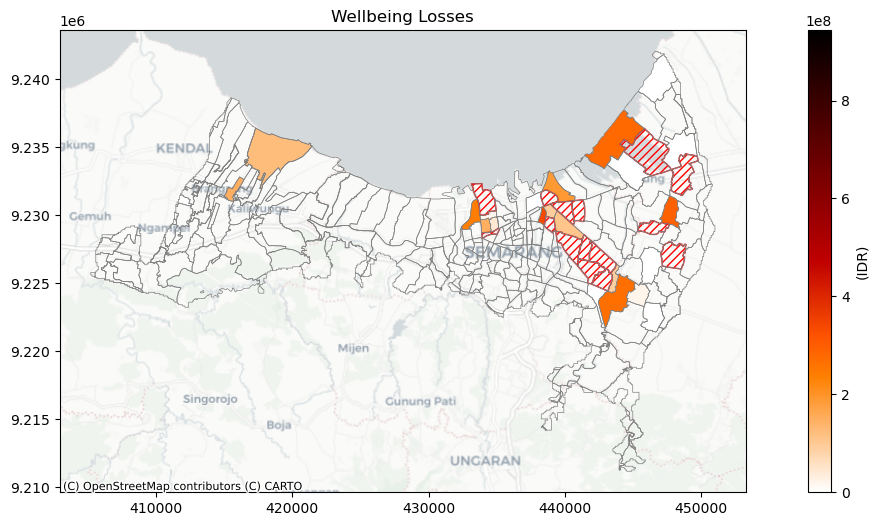

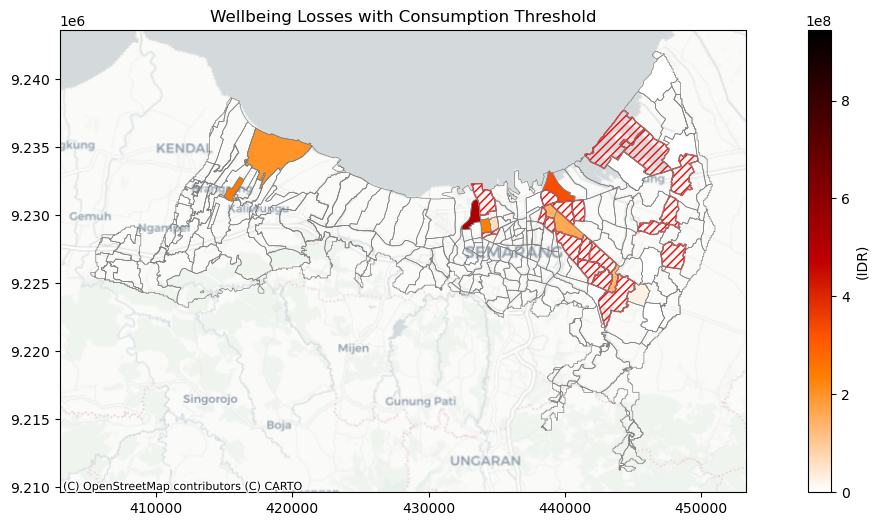

In [21]:
figsize=(16, 6)
# enforce same vmax
vmax = max(filtered_impacts['Damage: Structure'].max(), filtered_impacts['Equity Weighted Loss'].max(), filtered_impacts['Wellbeing Loss'].max())
vmin=0

fig, ax = plt.subplots(figsize=figsize)
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
filtered_impacts.plot(ax=ax, column='Damage: Structure', cmap=cmap, vmin=0, vmax=vmax, legend=True, legend_kwds={"label": f"({currency})"})
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)
ax.set_title('Damages to Structure')

fig, ax = plt.subplots(figsize=figsize)
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
filtered_impacts.plot(ax=ax, column='Equity Weighted Loss', cmap=cmap, vmin=0, vmax=vmax, legend=True, legend_kwds={"label": f"({currency})"})
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)
ax.set_title('EW Damages to Structure')

fig, ax = plt.subplots(figsize=figsize)
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
filtered_impacts.plot(
    ax=ax,
    column='Wellbeing Loss',
    cmap=cmap,
    vmin=0,
    vmax=vmax,
    legend=True,
    legend_kwds={"label": f"({currency})"},
    missing_kwds={"color": (0,0,0,0), "edgecolor": "red", "hatch": "////", "label": "Missing values"})
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)
ax.set_title('Wellbeing Losses')

fig, ax = plt.subplots(figsize=figsize)
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
thresh_impacts.plot(
    ax=ax,
    column='Wellbeing Loss',
    cmap=cmap,
    vmin=0,
    vmax=vmax,
    legend=True,
    legend_kwds={"label": f"({currency})"},
    missing_kwds={"color": (0,0,0,0), "edgecolor": "red", "hatch": "////", "label": "Missing values"})
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)
ax.set_title('Wellbeing Losses with Consumption Threshold')


Text(0.5, 1.0, 'Consumption Loss with Consumption Threshold')

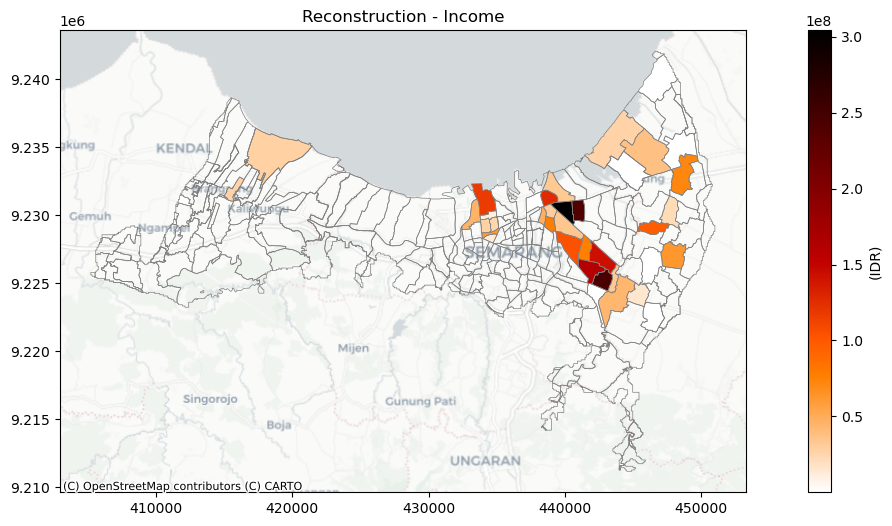

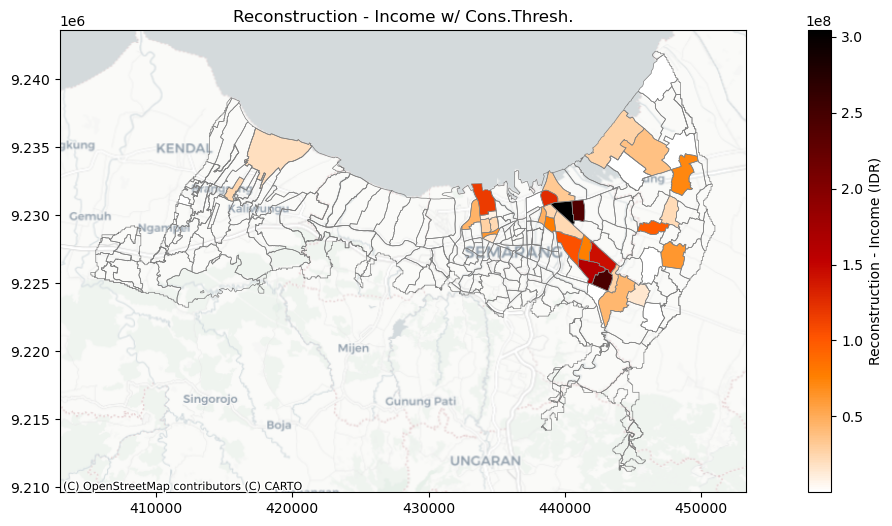

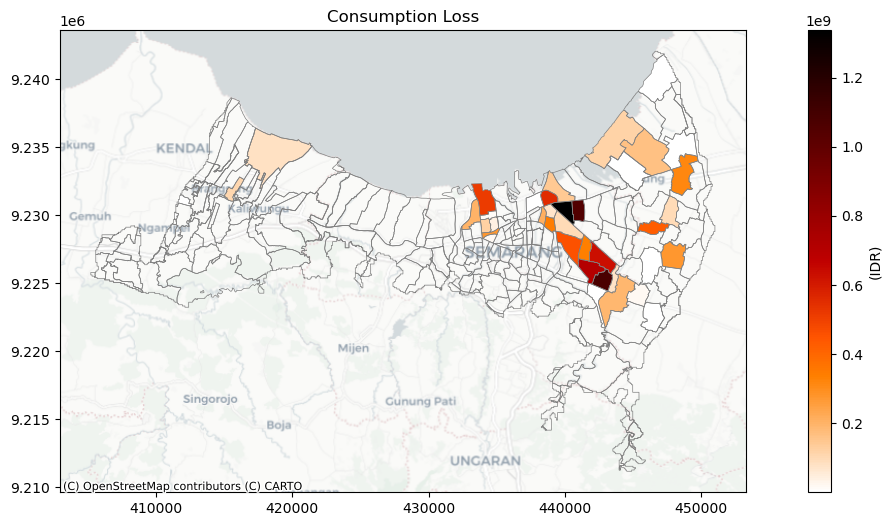

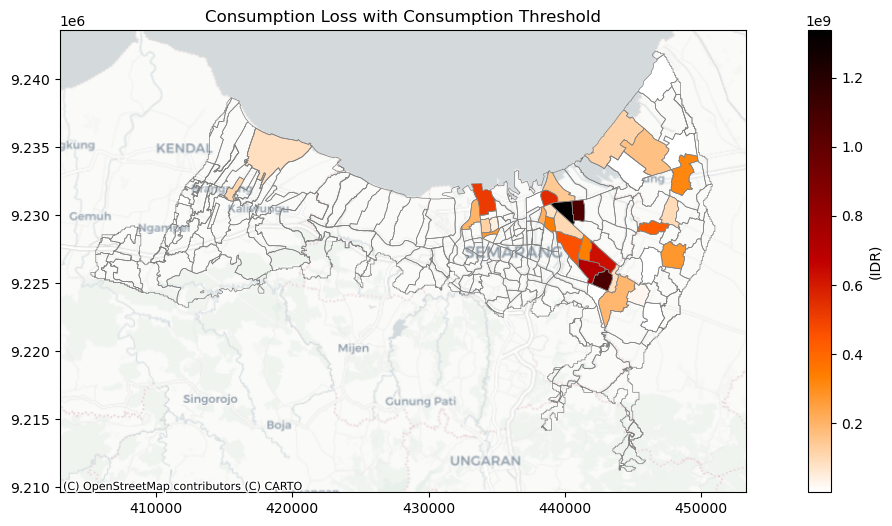

In [25]:
filtered_impacts['Reco-Inc'] = filtered_impacts['Reconstruction Costs'] - filtered_impacts['Income Loss']
thresh_impacts['Reco-Inc'] = thresh_impacts['Reconstruction Costs'] - thresh_impacts['Income Loss']

fig, ax = plt.subplots(figsize=figsize)
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
filtered_impacts.plot(ax=ax, column='Reco-Inc', cmap=cmap, legend=True, legend_kwds={"label": f"({currency})"})
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)
ax.set_title('Reconstruction - Income')

fig, ax = plt.subplots(figsize=figsize)
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
thresh_impacts.plot(ax=ax, column='Reco-Inc', cmap=cmap, legend=True, legend_kwds={"label": f"Reconstruction - Income ({currency})"})
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)
ax.set_title('Reconstruction - Income w/ Cons.Thresh.')

fig, ax = plt.subplots(figsize=figsize)
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
filtered_impacts.plot(ax=ax, column='Consumption Loss', cmap=cmap, legend=True, legend_kwds={"label": f"({currency})"})
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)
ax.set_title('Consumption Loss')

fig, ax = plt.subplots(figsize=figsize)
agg_impacts.boundary.plot(ax=ax, color='grey', lw=0.5)
thresh_impacts.plot(ax=ax, column='Consumption Loss', cmap=cmap, legend=True, legend_kwds={"label": f"({currency})"})
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)
ax.set_title('Consumption Loss with Consumption Threshold')

## 4. Correlation socio economic vulnerability and relative damages
Use original poverty data not the modified, then we have for high values of this and relative damage the more prioritization the villages should get

In [24]:
categories = ['0-0.2', '0.2-0.4', '0.4-0.6', '0.6-0.8', '0.8-1']
categories = [0.2, 0.4, 0.6, 0.8, 1]
bins = [0, 0.2, 0.4, 0.6, 0.8, 1]

# relative damage
agg_impacts['rel_dam_category'] = pd.cut(
    agg_impacts['relative_damages'],
    bins=bins,
    labels=categories
    )

# poverty variable, this should be normalized despite being already a value between 0 and 1
agg_impacts[str(int_pov_var)+'_category'] = pd.cut(
    agg_impacts[int_pov_var],
    bins=bins,
    labels=categories
)

In [25]:
len(agg_impacts)

259

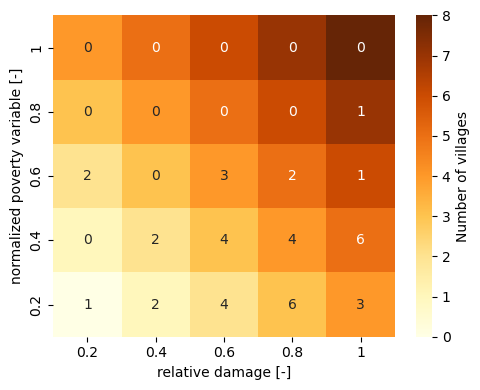

In [26]:
combination_counts = agg_impacts.groupby(
    [str(int_pov_var)+'_category', 'rel_dam_category']
    ).size().unstack(fill_value=0)

def heatmap(combination_counts, categories):

    row_ind, col_ind = np.indices(combination_counts.shape)
    pos_vals = row_ind + col_ind

    fig, ax  = plt.subplots(figsize=(5, 4))
    sns.heatmap(
        pos_vals,
        annot=combination_counts,
        fmt="d",
        cmap='YlOrBr',
        xticklabels=categories,
        yticklabels=categories,
        cbar_kws={'label': 'Number of villages'}
        )
    ax.set_xlabel('relative damage [-]')
    ax.set_ylabel('normalized poverty variable [-]')
    ax.invert_yaxis()  # if positive variable then remove this
    plt.tight_layout()
    return fig

fig = heatmap(combination_counts, categories)

In [27]:
agg_impacts['rel_dam_category'] = agg_impacts['rel_dam_category'].astype(float)
agg_impacts[str(int_pov_var)+'_category'] = agg_impacts[str(int_pov_var)+'_category'].astype(float)

In [28]:
import folium
from ipywidgets import FloatSlider, VBox
from IPython.display import display, clear_output

# get center
minx, miny, maxx, maxy = village_boundaries.to_crs("EPSG:4326").geometry.total_bounds
lon = (minx + maxx) /2
lat = (miny + maxy) / 2

map_center = [lat, lon]


# Function to update folium map based on slider input
def update_map(pov_bin_val, rel_dam_bin_val):
    clear_output(wait=True)  # clear previous output

    # Create base map
    f = folium.Figure(width=700, height=400)
    m = folium.Map(location=map_center, tiles="openstreetmap", zoom_start=11).add_to(f)

    # Filter polygons
    filtered = agg_impacts[
        (agg_impacts[str(int_pov_var)+'_category'] == pov_bin_val) &
        (agg_impacts['rel_dam_category'] == rel_dam_bin_val)
    ]
    
    # Add polygons to map
    if not filtered.empty:
        folium.GeoJson(
            filtered,
            style_function=lambda x: {
                'fillColor': 'orange',
                'color': 'black',
                'weight': 1,
                'fillOpacity': 0.6
            },
            name="Filtered Polygons"
        ).add_to(m)
    

    def style_fn(x):
        return {'color': 'black',
                'weight': 1,
                'fillOpacity': 0}

    
    folium.GeoJson(
        agg_impacts,
        style_function=style_fn,
        popup=folium.GeoJsonPopup(agg_impacts.drop(columns=["geometry"]).columns.tolist()),
        tooltip=folium.GeoJsonTooltip(
            fields=[int_pov_var, 'relative_damages'])
    ).add_to(m)

    display(m)
    display(VBox([pov_slider, rel_dam_slider]))


pov_slider = FloatSlider(min=0.2, max=1, step=0.2, value=0.2, description="poverty_bin")
rel_dam_slider = FloatSlider(min=0.2, max=1, step=0.2, value=0.2, description="relative_damage_bin")

# Connect sliders to update_map function
def on_slider_change(change):
    update_map(pov_slider.value, rel_dam_slider.value)

# Observe slider changes
pov_slider.observe(on_slider_change, names="value")
rel_dam_slider.observe(on_slider_change, names="value")

# Initial display
update_map(pov_slider.value, rel_dam_slider.value)

instead of having a fixed map, have a dynamic with threshold slider. 2 separate sliders for x and y axis. 

In [29]:
agg_impacts.explore()

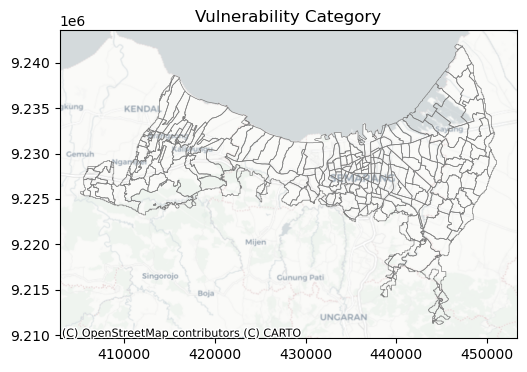

In [30]:
fig, ax = plt.subplots(figsize=(13, 4))
ax.set_title(f'Vulnerability Category')
village_boundaries.boundary.plot(ax=ax, color='grey', lw=0.5)
# agg_impacts.plot(ax=ax, color=agg_impacts['color'], legend=True, legend_kwds={"label": "Vulnerability category"})
cx.add_basemap(ax, crs=crs_utm, source=cx.providers.CartoDB.Positron)

In [31]:
agg_impacts.columns

Index(['provinceNo', 'regencyCityNo', 'KECNO', 'villageNo', 'province',
       'regencyCity', 'village', 'villageID', 'villageArea',
       'TotalDamageEvent', 'geometry', 'Damage: Structure',
       'Max Potential Damage: Structure', 'p0_intl', 'p0_gkn', 'Population',
       'PopulationTouched', 'modified_p0_intl', 'EW_15', 'EW_12',
       'EW_15_damages', 'EW_12_damages', 'yearly_income', 'total_income',
       'relative_damages', 'rel_dam_category', 'p0_intl_category'],
      dtype='object')